# Performance of policies trained in single-agent environment

In this notebook, we load the three policies we have trained in the previous notebook and check their performance on the whole group. We start by reloading the environment

In [1]:
from navground.learning import io

env = io.load_env('env.yaml')

Although not stricly required for our analysis, we export the polices to onnx, to speed-up inference

In [2]:
from navground.learning import onnx
from navground.learning.il import BC, DAgger
from stable_baselines3 import SAC

for algo in (BC, DAgger, SAC):
    path = algo.__name__
    onnx.export(algo.load(f"{path}/model").policy, path=f"{path}/policy.onnx")

We want to measure the rewards of the whole group when a `number` of agents 
applies one of the trained policies and the rest of the agents continue to follow `HL`.

In [3]:
import numpy as np
from navground.learning.evaluation import make_experiment_with_env
from navground.learning.parallel_env import make_shared_parallel_env_with_env
from navground.learning import GroupConfig

ma_env = make_shared_parallel_env_with_env(env=env)

def get_groups_rewards(policy, number=1, number_of_episodes=1, policy_color='', processes=1):
    policy_group = GroupConfig(indices=slice(None, number), 
                               policy=policy,
                               color=policy_color)
    hl_group = GroupConfig(indices=slice(number, None))   
    exp = make_experiment_with_env(ma_env, groups=[policy_group, hl_group])
    exp.number_of_runs = number_of_episodes
    if processes > 1:
        exp.run_mp(number_of_processes=processes, keep=True)
    else:
        exp.run()
    rewards = np.asarray([run.get_record("reward") for run in exp.runs.values()])
    policy_rewards = rewards[..., :number]
    hl_rewards = rewards[..., number:]
    return policy_rewards, hl_rewards

We record the reward at each step and for each agent (i.e., not averaged over the episode), 
as an array of shape 

`(number_of_episodes, number of steps = 600, number of agents in the group)`

In [4]:
policy_rewards, hl_rewards = get_groups_rewards('BC/policy.onnx', number_of_episodes=3)

In [5]:
policy_rewards.shape, hl_rewards.shape

((3, 600, 1), (3, 600, 19))

## One agent following the policy

We start by measuring the performances when 1 agent follows the policy and 19 follow HL, like during training.

In [6]:
policy_rewards = {}
hl_rewards = {}
models = ('BC', 'DAgger', 'SAC')

for name in models:
    policy_rewards[name], hl_rewards[name] = get_groups_rewards(
        policy=f'{name}/policy.onnx', number_of_episodes=100, processes=8)

We observa that the single policy agent is not impacting the 19 other agents much (we have measured in the previous notebook that 20 HL agents have a reward around -0.22).

In [7]:
import pandas as pd

pd.set_option("display.precision", 3)

policy_mean = {}
policy_std = {}
hl_mean = {}
hl_std = {}

for (name, policy_rs), (_, hl_rs) in zip(policy_rewards.items(), hl_rewards.items()):
    policy_mean[name], policy_std[name] = np.mean(policy_rs), np.std(policy_rs)
    hl_mean[name], hl_std[name] = np.mean(hl_rs), np.std(hl_rs)

rewards_1_19 = pd.DataFrame({'Reward of 1 agent with policy':  policy_mean, 
                             'Reward of 19 agents with HL': hl_mean})
rewards_1_19

,Reward of 1 agent with policy,Reward of 19 agents with HL
BC,-0.310,-0.232
DAgger,-0.335,-0.228
SAC,-0.170,-0.234


Let us have a look at the distribution of the rewards.

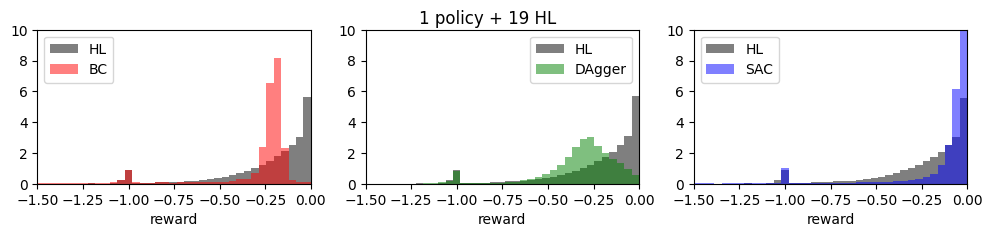

In [8]:
from matplotlib import pyplot as plt

colors = {'BC': 'red', 'DAgger': 'green', 'SAC': 'blue'}

fig, axs = plt.subplots(ncols=3, figsize=(12, 2))
for ax, (name, policy_rs), (_, hl_rs)  in zip(axs, hl_rewards.items(), policy_rewards.items()):
    bins = np.linspace(-2, 0, 50)
    ax.hist(policy_rs.flatten(), density=True, color='black', alpha=0.5, bins=bins, label="HL");
    ax.hist(hl_rs.flatten(), density=True, color=colors[name], alpha=0.5, bins=bins, label=name)
    ax.set_xlim(-1.5, 0)
    ax.set_ylim(0, 10)
    ax.set_xlabel('reward')
    ax.legend()
fig.suptitle('1 policy + 19 HL');

Next, we display a video of one run for each policy. The runs cover a simulated time that is 3 times longer than the episodes, but the videos are speeded up by x 10, so it last 18 seconds (180 seconds of simulated time).

In [9]:
import moviepy as mpy
from navground.sim.ui.video import make_video_from_run

def make_video(policy, number=1, policy_color='', duration=60, seed=0, 
               factor=10, width=300):
    policy_group = GroupConfig(indices=slice(None, number), 
                               policy=policy,
                               color=policy_color)
    exp = make_experiment_with_env(ma_env, groups=[policy_group], 
                                   record_reward=False)
    exp.record_config.pose = True
    exp.number_of_runs = 1
    exp.steps = int(duration / 0.1)
    exp.run_index = seed
    exp.run()
    return make_video_from_run(exp.runs[seed], factor=factor, width=width)

In [10]:
width = 300
duration = 60 * 3

videos = [make_video(f'{name}/policy.onnx', factor=10, width=width, 
                     duration=duration, policy_color=colors[name]) 
          for name in models]

x = 0
for i, video in enumerate(videos):
    video.pos = lambda _, x=x: (x, 0)
    x += video.size[0]

width = sum(video.size[0] for video in videos)
height = max(video.size[1] for video in videos)
duration = max(video.duration for video in videos)

img = mpy.ImageClip(np.full((height, width, 3), 255, dtype=np.uint8), duration=duration)
cc = mpy.CompositeVideoClip(clips=[img] + videos)
cc.display_in_notebook(fps=30, width=900, rd_kwargs=dict(logger=None))

We note that the RL agent (SAC, blue) has learned that the grey HL agents will try to avoid it, even if it makes little effort to avoid them. In general, benchmarking the performance of the policies in this scenario is a bit problematic, as obstacle avoidance is a cooperative task: the HL agents by actively avoiding the policy agents like any other neightbor, make the task easier. Let us compute for comparison the reward that a dummy policy, always travelling straight, gets in this scenario:

In [11]:
from copy import copy
from navground import core, sim
from navground.learning.probes import RewardProbe
from functools import partial

def set_first_agent_to_dummy(world, seed):
    world.agents[0].behavior = core.behaviors.DummyBehavior()
    world.agents[0].state_estimation = None
    
scenario = copy(env.unwrapped.scenario)
scenario.add_init(set_first_agent_to_dummy)
exp = sim.Experiment(time_step=0.1, steps=600)
exp.scenario = scenario
exp.add_record_probe('reward', partial(RewardProbe, groups=env.unwrapped.groups_config))
exp.number_of_runs = 100
exp.run()
rewards = np.asarray([run.get_record("reward") for run in exp.runs.values()])

print(f"Dummy reward: {np.mean(rewards): .2f}")

Dummy reward: -0.23


... almost the same as HL.

## More agents following the policy

It is more interesting to immerse the policy agents in an environment where other agents are using the same policy. It is not very fair, as such a testing environment is different than the (easier) training evironment populated by the cooperative HL agents. 

Let us start by reproducing similar videos as above but more agents following the policy

In [12]:
width = 300
duration = 60 * 2

videos = [
    [make_video(f'{name}/policy.onnx', number=number, factor=10, 
                width=width, duration=duration, policy_color=colors[name]) 
     for name in models] for number in (5, 10, 19)]

x = 0
width = 0
for i, vs in enumerate(videos):
    y = 0
    for j, video in enumerate(vs):
        video.pos = lambda _, x=x, y=y: (y, x)
        y += video.size[1]
    x += video.size[0]
    

videos = sum(videos, []) 
duration = max(video.duration for video in videos)

img = mpy.ImageClip(np.full((x, y, 3), 255, dtype=np.uint8), duration=duration)
cc = mpy.CompositeVideoClip(clips=[img] + videos)
cc.display_in_notebook(fps=30, width=600, rd_kwargs=dict(logger=None))

The behavior is now very different than HL: 

- `BC` agents are not really able to avoid each other, 
- `DAgger` agents seems to maintain a decent behavior but have lots of collisions
- `SAC` agents are far too greedy and very unsafe.

We quantify this observations running another series of experiments to compute the reward distribution and mean.

In [13]:
number_of_episodes = 100
ns = (1, 5, 10, 15, 19)
numbers = []
rewards = []
policies = []
targets = []
means = []
for number in ns:
    for name in models:
        ps, hs = get_groups_rewards(
            policy=f'{name}/policy.onnx', 
            number_of_episodes=number_of_episodes, 
            processes=8, number=number)
        rewards.append(ps)
        means.append(np.mean(ps))
        numbers.append(number)
        policies.append(name)
        targets.append('policy')
        rewards.append(hs)
        means.append(np.mean(hs))
        numbers.append(number)
        policies.append(name)
        targets.append('HL')

In [19]:
data = pd.DataFrame(dict(number=numbers, reward=means, policy=policies, group=targets))
data.to_csv('rewards_env.csv')

In the plot below, solid lines are the average over all agents, dotted lines over agents following HL and dashed lines over agents following the policy.

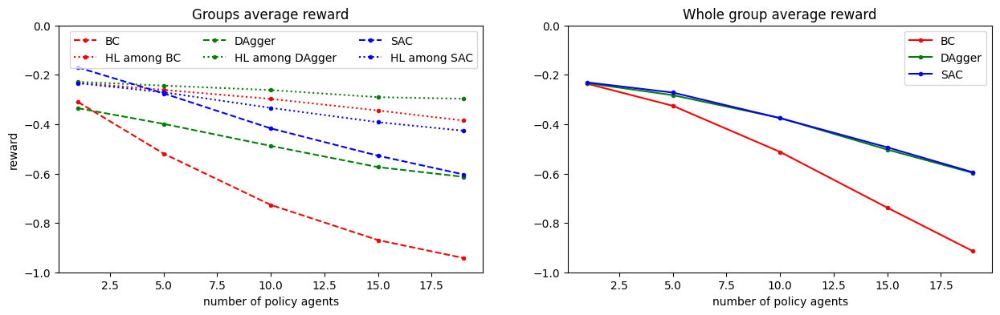

In [51]:
_, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 4))

for name, ds in data.groupby('policy'):
    ps = ds[ds.group=='policy']
    hs = ds[ds.group=='HL']
    num = np.asarray(ps.number)
    ax1.plot(ps.number, ps.reward, '.--', color=colors[name], label=name)
    ax1.plot(hs.number, hs.reward, '.:', color=colors[name], label=f'HL among {name}')
    total = (num * np.asarray(ps.reward) + (20 - num) * np.asarray(hs.reward)) / 20 
    ax2.plot(ps.number, total, '.-', color=colors[name], label=name)
ax1.legend(ncols=3)
ax2.legend(ncols=1)
ax1.set_xlabel('number of policy agents')
ax1.set_ylim(-1, 0)
ax2.set_xlabel('number of policy agents')
ax2.set_ylim(-1, 0)
ax1.set_ylabel('reward')
ax1.set_title('Groups average reward');
ax2.set_title('Whole group average reward');

We see that the whole group performance decreases (as we expected from the videos) when a larger fraction of agents follows the ML policy. As we have already seen, the SAC policy for one agent perform better than HL and the two IL policies. Interestingly but not surprising, compared to the IL policies, the RL policy leads to higher rewards for the agents following it and to lower rewards for the HL agents. Comparing SAC and DAgger, 

1. the whole group performance degrades similarly
2. DAgger impacts less the HL agent's performance

which is intuitively understandable, as DAgger has been trained to imitate HL agents and HL agents performs well among themselves. Even BC impacts less the HL performance than SAC, but in this case, the whole group perfomance degrades a lot as they agents get blocked in a jam.

The histograms below tells a similar story:
- SAC move straight but with lots of safety violations (the -2 rewards)
- BC agents are stuck togeter for about 50% of the time
- DAgger agents have less outlier (less violations/collisions) and their number not impact the rewards distribution as much as the others.

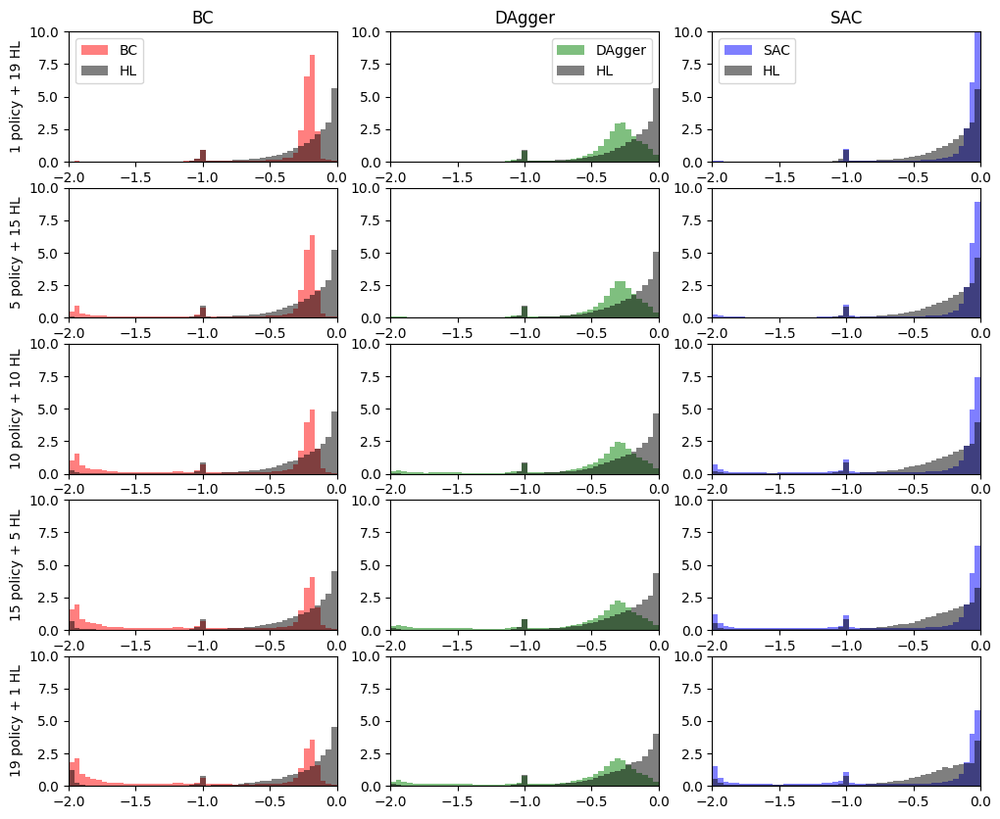

In [17]:
from matplotlib import pyplot as plt

fig, axs = plt.subplots(ncols=3, nrows=5, figsize=(12, 10))

i = 0
for cols, number in zip(axs, ns):
    bins = np.linspace(-2, 0, 50)
    for ax, name in zip(cols, models):
        if name == 'BC':
            ax.set_ylabel(f"{number} policy + {20 - number} HL", rotation=90)
        ax.hist(rewards[i].flatten(), density=True, 
                color=colors[name], alpha=0.5, bins=bins, label=name)
        i += 1
        ax.hist(rewards[i].flatten(), density=True, 
                color='black', alpha=0.5, bins=bins, label="HL")
        ax.set_xlim(-2, 0)
        ax.set_ylim(0, 10)
        i += 1
        if number == 1:
            ax.set_title(name)
            ax.legend()

In the next notebook, we are going to train the agents to perform among peers, therefore using as training the scenario that here we have considered just for testing.